In [1]:
from google.colab import drive
drive.mount('/content/drive')

!pip install import-ipynb
!pip install imagecodecs

import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/Stage')

import import_ipynb

Mounted at /content/drive


In [2]:
import sys
sys.path.append('/media/user/T7 Touch/Stage_Lucas/segmentation/')  # Replace with the actual path

In [4]:
from src.downloads import download_data, unzip_data, download_software
from src.visualization import tif_to_point_cloud, visualize_point_cloud
from src.segmentation import folder_mask, remove_pixels
from src.nets import UNet
from src.transformations import CenterCrop, RandomCrop, VerticalFlip, HorizontalFlip, ToTensor
from src.datasets import Cell_Challenge_Segmentation_Dataset
from src.training import train_UNet

import os

import numpy as np
import tifffile as tiff
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import torch
import torch.nn as nn
from torchvision import transforms
from torch.nn import functional
from torch.utils.data import Dataset, DataLoader, random_split
import albumentations as alb

from skimage.segmentation import clear_border
from skimage.measure import label,regionprops
from scipy import ndimage as ndi

In [2]:
cell_type = 'Fluo-N3DH-CHO'

In [4]:
tif_file = f'content/Segmentation/training_data/{cell_type}/01/t001.tif'

download_data(cell_type)
unzip_data(cell_type)

Fluo-N3DH-CHO training_data data already downloaded
Fluo-N3DH-CHO challenge_data data already downloaded
Fluo-N3DH-CHO training_data data already unzipped
Fluo-N3DH-CHO challenge_data data already unzipped


In [4]:
point_cloud, values = tif_to_point_cloud(tif_file)
visualize_point_cloud(point_cloud, values)

In [25]:
from skimage import measure

tif = tiff.imread('/media/user/T7 Touch/Stage_Lucas/segmentation/data/external/Cell Challenge/training_data/Fluo-N3DH-CHO/01_ST/SEG/man_seg000.tif')

verts, faces, _, _ = measure.marching_cubes(tif, 0)

In [26]:
fig = go.Figure(data=[
    go.Mesh3d(
        x=verts[:, 1],  # X-coordinates of vertices
        y=verts[:, 2],  # Y-coordinates of vertices
        z=verts[:, 0],  # Z-coordinates of vertices
        # i, j and k give the vertices of triangles
        # here we represent the 4 triangles of the tetrahedron surface
        i=faces[:, 1],  # Indices of the first vertex of each face
        j=faces[:, 2],  # Indices of the second vertex of each face
        k=faces[:, 0],  # Indices of the third vertex of each face
        opacity=1,
        intensity=verts[:,0],
        colorscale='Viridis',
        showscale=True
    )],

    layout = dict(
        scene=dict(
            aspectmode='manual',  # Set the aspect ratio manually
            aspectratio=dict(x=1, y=1, z=0.05)  # Set the desired aspect ratio
        )
    )
)

fig.show()

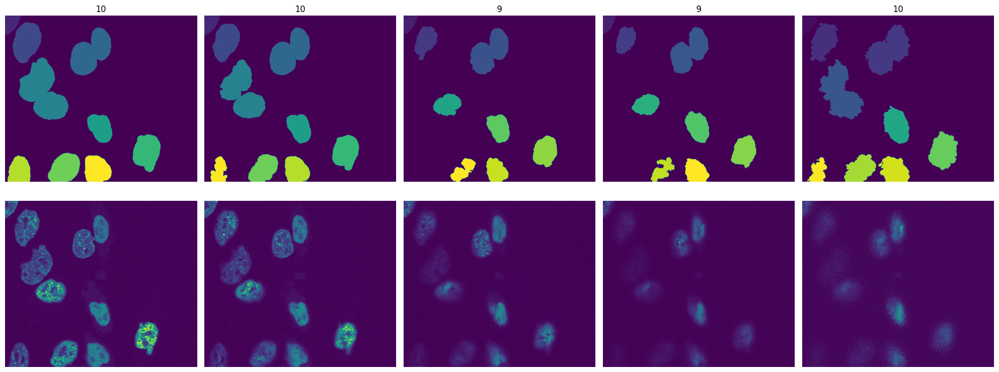

In [26]:
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import (
    filters, measure, morphology, util
)

tif_file = "content/Segmentation/training_data/Fluo-N3DH-CHO/01/t000.tif"
image = tiff.imread(tif_file)
plt.figure(figsize=(20, 8))
new_image = np.zeros_like(image)

for i,im in enumerate(image):

    threshold = filters.threshold_otsu(im)

    cells = im > threshold

    smoother_dividing = filters.rank.mean(util.img_as_ubyte(cells),
                                        morphology.disk(7))

    binary_smoother_dividing = smoother_dividing > 2

    fill = ndi.binary_fill_holes(binary_smoother_dividing)
    cleaned_dividing = measure.label(fill)
    cleaned = remove_pixels(cleaned_dividing, 1000)

    plt.subplot(2, 5, i+1)
    plt.imshow(cleaned)

    plt.title(len(np.unique(cleaned)))
    plt.axis('Off')

    plt.subplot(2, 5, i+6)
    plt.imshow(im)
    plt.axis('Off')
    plt.tight_layout()
    
    new_image[i,:,:] = cleaned > 0

plt.show()

In [31]:
from skimage import measure

verts, faces, _, _ = measure.marching_cubes(new_image, 0.5)

fig = go.Figure(data=[
    go.Mesh3d(
        x=verts[:, 1],  # X-coordinates of vertices
        y=verts[:, 2],  # Y-coordinates of vertices
        z=verts[:, 0],  # Z-coordinates of vertices
        # i, j and k give the vertices of triangles
        # here we represent the 4 triangles of the tetrahedron surface
        i=faces[:, 1],  # Indices of the first vertex of each face
        j=faces[:, 2],  # Indices of the second vertex of each face
        k=faces[:, 0],  # Indices of the third vertex of each face
        opacity=1,
        intensity=verts[:,0],
        colorscale='Viridis',
        showscale=True
    )],

    layout = dict(
        scene=dict(
            aspectmode='manual',  # Set the aspect ratio manually
            aspectratio=dict(x=1, y=1, z=0.05)  # Set the desired aspect ratio
        )
    )
)

fig.show()

### Images from Alice's Dataset

In [6]:
from aicsimageio.readers import CziReader

reader = CziReader("content/New-02-Scene-1-A1.czi")

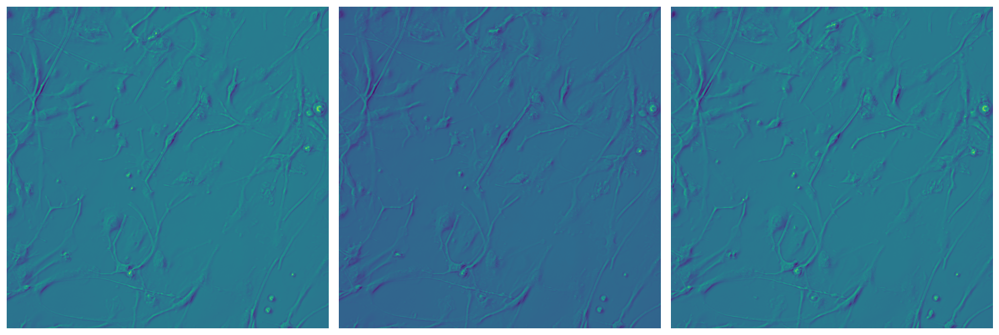

In [132]:
plt.figure(figsize=(15,25))
t = 3
for i in range(t):
    plt.subplot(int(np.ceil(t/3)),3,i+1)
    plt.imshow(reader.data[i,0,0,0,:,:])
    plt.axis('Off')
    plt.tight_layout()

plt.show()

### Stanford Dataset

In [2]:
import pandas as pd

data = pd.read_csv('content/Stanford3dDataset_v1.2/Area_1/office_1/Annotations/chair_1.txt', names=["X", "Y", "Z", "R", "G", "B"], sep=' ')
data.head()

,X,Y,Z,R,G,B
0,-20.065,36.566,0.806,99.0,89.0,79.0
1,-20.051,36.536,0.791,108.0,101.0,83.0
2,-20.056,36.534,0.789,96.0,88.0,75.0
3,-20.088,36.616,0.829,95.0,87.0,84.0
4,-20.075,36.592,0.818,86.0,79.0,69.0


In [4]:
import plotly.graph_objects as go

In [5]:
def visualize_point_cloud(point_cloud):
    """
    Function to represent a point cloud giving it color depending on certein values.

    Inputs: outputs of tif_to_point_cloud(file) fucntion.
        - point_cloud:
        - values:
    
    Outputs: plotly go.Figure.
    """

    fig = go.Figure(
        data=[
            go.Scatter3d(
                x=point_cloud['X'], y=point_cloud['Y'], z=point_cloud['Z'], 
                mode='markers',
                marker=dict(
                    size=1,
                    color=[f'rgb({r},{g},{b})' for r,g,b in zip(point_cloud['R'], point_cloud['G'], point_cloud['B'])]
                )
            )
        ],

        layout=dict(
            scene=dict(
                aspectratio=dict(x=1, y=1, z=1),
                xaxis=dict(visible=True),
                yaxis=dict(visible=True),
                zaxis=dict(visible=True)
            )
        )
    )

    fig.show()

    return

In [7]:
visualize_point_cloud(data)

### DiffusionNet .off and .obj files

In [1]:
import numpy as np

def read_off(file_path):

    file = open(file_path)

    file_type = file.readline() # ignore first line
    num_vertices, num_faces, _ = file.readline().split()
    num_vertices, num_faces = int(num_vertices), int(num_faces)

    vertices, faces = [], []
    with open(file_path) as file:
        for idx,line in enumerate(file):
            if idx == 0 or idx == 1:
                continue

            data = line.split()
            if idx < num_vertices+2:
                vertices.append(data)

            else:
                faces.append(data[1:])

    return np.array(vertices).astype(float), np.array(faces).astype(int)

In [17]:
def read_obj(file_path):

    vertices, faces = [], []
    with open(file_path) as file:
        for line in file:
            data = line.split()

            if data[0] == 'v':
                vertices.append(data[1:])
            
            else:
                faces.append(data[1:])

    return np.array(vertices).astype(float), np.array(faces).astype(int)

In [24]:
off_file = 'diffusion-net/experiments/human_segmentation_original/data/sig17_seg_benchmark/meshes/train/adobe/FemaleFitZombieA_tri_fixed.off'
vertices, faces = read_off(off_file)

In [5]:
import plotly.graph_objects as go

x = vertices[:,0]
y = vertices[:,2]
z = vertices[:,1]

xmax = max(x) - min(x)
ymax = max(y) - min(y)
zmax = max(z) - min(z)

ratio = max(xmax, ymax, zmax)

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=1,
                color=z,                # set color to an array/list of desired values
                colorscale='Viridis',   # choose a colorscale
                opacity=0.8
            )
        )
    ],    
    layout=dict(
        scene=dict(
            aspectratio=dict(x=xmax/ratio, y=ymax/ratio, z=zmax/ratio),
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        )
    )
)

fig.show()

In [15]:
x = vertices[:,0]
y = vertices[:,2]
z = vertices[:,1]

xmax = max(x) - min(x)
ymax = max(y) - min(y)
zmax = max(z) - min(z)

ratio = max(xmax, ymax, zmax)

i = faces[:,0]
j = faces[:,2]
k = faces[:,1]

fig = go.Figure(
    data=[
        go.Mesh3d(
            x=x, y=y, z=z,
            i=i, j=j, k=k
        )
    ],
    layout=dict(
        scene=dict(
            aspectratio=dict(x=xmax/ratio, y=ymax/ratio, z=zmax/ratio),
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        )
    )
)

fig.show()

In [27]:
obj_file = 'diffusion-net/experiments/human_segmentation_original/data/sig17_seg_benchmark/meshes/train/MIT_animation/meshes_handstand/meshes/mesh_0050.obj'
verts, fac = read_obj(obj_file)

In [28]:
import plotly.graph_objects as go

x = verts[:,0]
y = verts[:,2]
z = verts[:,1]

xmax = max(x) - min(x)
ymax = max(y) - min(y)
zmax = max(z) - min(z)

ratio = max(xmax, ymax, zmax)

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=x, y=y, z=z,
            mode='markers',
            marker=dict(
                size=1,
                color=z,                # set color to an array/list of desired values
                colorscale='Viridis',   # choose a colorscale
                opacity=0.8
            )
        )
    ],    
    layout=dict(
        scene=dict(
            aspectratio=dict(x=xmax/ratio, y=ymax/ratio, z=zmax/ratio),
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        )
    )
)

fig.show()

In [37]:
np.max(fac, axis=0)

array([10002, 10002, 10002])

In [36]:
x = verts[:,0]
y = verts[:,2]
z = verts[:,1]

xmax = max(x) - min(x)
ymax = max(y) - min(y)
zmax = max(z) - min(z)

ratio = max(xmax, ymax, zmax)

i = fac[:,0]
j = fac[:,2]
k = fac[:,1]

fig = go.Figure(
    data=[
        go.Mesh3d(
            x=x, y=y, z=z,
            i=i, j=j, k=k
        )
    ],
    layout=dict(
        scene=dict(
            aspectratio=dict(x=xmax/ratio, y=ymax/ratio, z=zmax/ratio),
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        )
    )
)

fig.show()